# Necessary Imports, Add imports here as required

In [26]:
import numpy as np
import pandas as pd
import requests
import json
import os
import collections
import random
from datetime import date
from heapq import nlargest
import kaggle as kg
import panel as pn
from panel.interact import interact
from dotenv import load_dotenv
from panel import widgets
import plotly.express as px
pn.extension("plotly")
import hvplot.pandas
from zipfile import ZipFile
import matplotlib.pyplot as plt
%matplotlib inline

In [27]:
#Instructor Notes
#1. What about other potentioal industries that they can expand on if other industries are set to perform poorly or die if there is a reduction impact
#2. What can be some of the positives that can be create dout of a reduction
#3. What doe si tmean for a potential growth point of view for ht ecountries that stand to lose from CO2 reduction policies
#4. Counteract the negatives of the loss with the positives of a gain in green house gas reductions and co2 reductions
#5. We will narrow to conutries that have the most impact 
#6. Look at th elife expectancy and the correlationw ith a reduction or increase in carbon emissions
#7. Look at regional impacts


# Kaggle Dataset Imports via our kaggle api

1. CO2 GHG Emissions Data
2. Greenhouse Gas Emissisons
3. Global CO2 Emissions
4. Climate Change: Earth Surface Temperature Data
5. Global Commodity Trade Statistics
6. World development indicators by country


## CO2 GHG EMISSIONS DATA

In [11]:
!kaggle datasets download -d yoannboyere/co2-ghg-emissionsdata


  0%|          | 0.00/147k [00:00<?, ?B/s]
100%|##########| 147k/147k [00:00<00:00, 3.06MB/s]


In [12]:
file_name = 'co2-ghg-emissionsdata.zip' #the file is your dataset exact name
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


## GREEN HOUSE GAS EMISSIONS

In [13]:
!kaggle datasets download -d sansuthi/greenhouse-gas-emissions


  0%|          | 0.00/567 [00:00<?, ?B/s]
100%|##########| 567/567 [00:00<00:00, 258kB/s]


In [14]:
file_name = 'greenhouse-gas-emissions.zip' #the file is your dataset exact name
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


## GLOBAL CO2 EMISSIONS

In [15]:
!kaggle datasets download -d sansuthi/global-co2-emissions


  0%|          | 0.00/5.90k [00:00<?, ?B/s]
100%|##########| 5.90k/5.90k [00:00<00:00, 3.03MB/s]


In [16]:
file_name = 'global-co2-emissions.zip' #the file is your dataset exact name
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


## Climate Change: Earth Surface Temperature Data

In [17]:
!kaggle datasets download -d berkeleyearth/climate-change-earth-surface-temperature-data


  0%|          | 0.00/84.7M [00:00<?, ?B/s]
  1%|1         | 1.00M/84.7M [00:00<00:24, 3.57MB/s]
  2%|2         | 2.00M/84.7M [00:00<00:24, 3.56MB/s]
  4%|3         | 3.00M/84.7M [00:01<00:31, 2.75MB/s]
  5%|4         | 4.00M/84.7M [00:01<00:27, 3.10MB/s]
  6%|5         | 5.00M/84.7M [00:01<00:22, 3.68MB/s]
  7%|7         | 6.00M/84.7M [00:01<00:20, 4.02MB/s]
  8%|8         | 7.00M/84.7M [00:01<00:18, 4.38MB/s]
  9%|9         | 8.00M/84.7M [00:02<00:16, 4.91MB/s]
 11%|#         | 9.00M/84.7M [00:02<00:15, 5.04MB/s]
 12%|#1        | 10.0M/84.7M [00:02<00:17, 4.56MB/s]
 13%|#2        | 11.0M/84.7M [00:02<00:18, 4.24MB/s]
 14%|#4        | 12.0M/84.7M [00:03<00:23, 3.24MB/s]
 15%|#5        | 13.0M/84.7M [00:03<00:24, 3.13MB/s]
 17%|#6        | 14.0M/84.7M [00:03<00:20, 3.61MB/s]
 18%|#7        | 15.0M/84.7M [00:04<00:17, 4.12MB/s]
 19%|#8        | 16.0M/84.7M [00:04<00:17, 4.05MB/s]
 20%|##        | 17.0M/84.7M [00:04<00:18, 3.94MB/s]
 21%|##1       | 18.0M/84.7M [00:05<00:27, 2.56MB/s]
 

In [18]:
file_name = 'climate-change-earth-surface-temperature-data.zip' #the file is your dataset exact name
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


## Global commodity trade statistics

In [19]:
!kaggle datasets download -d unitednations/global-commodity-trade-statistics


  0%|          | 0.00/121M [00:00<?, ?B/s]
  1%|          | 1.00M/121M [00:00<00:27, 4.52MB/s]
  2%|1         | 2.00M/121M [00:00<00:24, 5.05MB/s]
  2%|2         | 3.00M/121M [00:00<00:22, 5.57MB/s]
  3%|3         | 4.00M/121M [00:00<00:21, 5.59MB/s]
  4%|4         | 5.00M/121M [00:00<00:20, 6.05MB/s]
  5%|4         | 6.00M/121M [00:01<00:21, 5.47MB/s]
  6%|5         | 7.00M/121M [00:01<00:34, 3.45MB/s]
  7%|6         | 8.00M/121M [00:01<00:29, 4.05MB/s]
  7%|7         | 9.00M/121M [00:02<00:28, 4.05MB/s]
  8%|8         | 10.0M/121M [00:02<00:24, 4.71MB/s]
  9%|9         | 11.0M/121M [00:02<00:21, 5.28MB/s]
 10%|9         | 12.0M/121M [00:02<00:25, 4.39MB/s]
 11%|#         | 13.0M/121M [00:03<00:29, 3.79MB/s]
 12%|#1        | 14.0M/121M [00:03<00:33, 3.32MB/s]
 12%|#2        | 15.0M/121M [00:03<00:31, 3.48MB/s]
 13%|#3        | 16.0M/121M [00:03<00:28, 3.85MB/s]
 14%|#4        | 17.0M/121M [00:04<00:33, 3.21MB/s]
 15%|#4        | 18.0M/121M [00:04<00:29, 3.59MB/s]
 16%|#5        | 19.

 40%|###9      | 48.0M/121M [00:14<00:21, 3.59MB/s]
 41%|####      | 49.0M/121M [00:14<00:18, 3.95MB/s]
 41%|####1     | 50.0M/121M [00:15<00:15, 4.72MB/s]
 42%|####2     | 51.0M/121M [00:15<00:21, 3.41MB/s]
 43%|####3     | 52.0M/121M [00:15<00:20, 3.44MB/s]
 44%|####3     | 53.0M/121M [00:16<00:21, 3.36MB/s]
 45%|####4     | 54.0M/121M [00:16<00:22, 3.15MB/s]
 46%|####5     | 55.0M/121M [00:16<00:19, 3.58MB/s]
 46%|####6     | 56.0M/121M [00:17<00:17, 3.98MB/s]
 47%|####7     | 57.0M/121M [00:17<00:15, 4.32MB/s]
 48%|####8     | 58.0M/121M [00:17<00:17, 3.74MB/s]
 49%|####8     | 59.0M/121M [00:17<00:18, 3.48MB/s]
 50%|####9     | 60.0M/121M [00:18<00:15, 4.01MB/s]
 51%|#####     | 61.0M/121M [00:18<00:13, 4.62MB/s]
 51%|#####1    | 62.0M/121M [00:18<00:12, 5.11MB/s]
 52%|#####2    | 63.0M/121M [00:18<00:10, 5.72MB/s]
 53%|#####3    | 64.0M/121M [00:18<00:09, 6.31MB/s]
 54%|#####3    | 65.0M/121M [00:18<00:11, 5.28MB/s]
 55%|#####4    | 66.0M/121M [00:19<00:10, 5.28MB/s]
 56%|#####5 

In [20]:
file_name = 'global-commodity-trade-statistics.zip' #the file is your dataset exact name
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


## World Development Indicators by Countries

In [21]:
!kaggle datasets download -d hn4ever/world-development-indicators-by-countries


  0%|          | 0.00/51.9k [00:00<?, ?B/s]
100%|##########| 51.9k/51.9k [00:00<00:00, 4.23MB/s]


In [22]:
file_name = 'world-development-indicators-by-countries.zip' #the file is your dataset exact name
with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

Done


In [ ]:
# file_name = 'latitude-and-longitude-for-every-country-and-state.zip' #the file is your dataset exact name
# with ZipFile(file_name, 'r') as zip:
#   zip.extractall()
#   print('Done')

## BRINGING DATA

In [28]:
carbon_emission_data = pd.read_csv('datasets/co2_emission.csv')
carbon_emission_life_expect_data =  pd.read_csv('datasets/CO2Emission_LifeExp.csv')
trade_statistics =  pd.read_csv('datasets/commodity_trade_statistics_data.csv', low_memory=False)
ghg_by_sector_data =  pd.read_csv('datasets/GHG-Emissions-by-sector.csv')
land_temp_by_city_data =  pd.read_csv('datasets/GlobalLandTemperaturesByCity.csv')
ghg_emissions_data = pd.read_csv('datasets/greenhouse_gas_emissions.csv')
sustainability_data = pd.read_csv('datasets/sustainability.csv')
energy_data = pd.read_csv('datasets/energy.csv')
country_gdp_data = pd.read_csv('datasets/countries of the world.csv')
country_locations = pd.read_csv('datasets/world_country_and_usa_states_latitude_and_longitude_values.csv')

## DATA CLEANING

## Carbon Emission Data Cleaning


In [29]:
carbon_emission_data

,Entity,Code,Year,Annual CO₂ emissions (tonnes )
0,Afghanistan,AFG,1949,14656.00
1,Afghanistan,AFG,1950,84272.00
2,Afghanistan,AFG,1951,91600.00
3,Afghanistan,AFG,1952,91600.00
4,Afghanistan,AFG,1953,106256.00
...,...,...,...,...
20848,Zimbabwe,ZWE,2013,11536239.29
20849,Zimbabwe,ZWE,2014,11866348.41
20850,Zimbabwe,ZWE,2015,10907603.94
20851,Zimbabwe,ZWE,2016,9932649.88


In [30]:
pivoted_data = carbon_emission_data.pivot(index='Entity', columns=['Year'], values='Annual CO₂ emissions (tonnes )')
pivoted_data.head()
# changed dataframe columns and Index

Year,1751,1752,1753,1754,1755,1756,1757,1758,1759,1760,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Entity,,,,,,,,,,,,,,,,,,,,,
Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.198330e+06,6.760313e+06,8.452224e+06,1.222602e+07,1.074206e+07,1.000041e+07,9.789186e+06,1.010743e+07,1.225791e+07,1.301474e+07
Africa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.178143e+09,1.188276e+09,1.193784e+09,1.198373e+09,1.233842e+09,1.250644e+09,1.290489e+09,1.289003e+09,1.310656e+09,1.331740e+09
Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.371152e+06,4.374816e+06,4.594656e+06,5.235856e+06,4.906096e+06,5.059984e+06,5.712176e+06,5.947724e+06,6.272858e+06,6.379207e+06
Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.090318e+08,1.201859e+08,1.178141e+08,1.198069e+08,1.281100e+08,1.324346e+08,1.431771e+08,1.505925e+08,1.503780e+08,1.505514e+08
Americas (other),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.226580e+09,2.157619e+09,2.253919e+09,2.294779e+09,2.375406e+09,2.406775e+09,2.443171e+09,2.435554e+09,2.415058e+09,2.398632e+09


In [31]:
cleaned_country_data = pivoted_data.rename_axis(None)

In [32]:
cleaned_country_data_transposed = cleaned_country_data.T

In [33]:
cleaned_country_data_transposed

,Afghanistan,Africa,Albania,Algeria,Americas (other),Andorra,Angola,Anguilla,Antarctic Fisheries,Antigua and Barbuda,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wallis and Futuna Islands,World,Yemen,Zambia,Zimbabwe
Year,,,,,,,,,,,,,,,,,,,,,
1751,NaN,0.000000e+00,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9.350528e+06,NaN,NaN,NaN
1752,NaN,0.000000e+00,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9.354192e+06,NaN,NaN,NaN
1753,NaN,0.000000e+00,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9.354192e+06,NaN,NaN,NaN
1754,NaN,0.000000e+00,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9.357856e+06,NaN,NaN,NaN
1755,NaN,0.000000e+00,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,9.361520e+06,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013,10000414.29,1.250644e+09,5059984.00,132434630.3,2.406775e+09,476320.00,32373114.67,135568.00,NaN,523952.00,...,7489843.70,1.026549e+08,106256.00,182868919.2,140438875.8,21984.00,3.520789e+10,24980412.88,3756144.70,11536239.29
2014,9789185.57,1.290489e+09,5712176.00,143177050.1,2.443171e+09,461664.00,34457641.91,142896.00,NaN,531280.00,...,6656106.94,1.044808e+08,153888.00,184236581.7,159712377.1,21984.00,3.550583e+10,22262570.05,4255726.27,11866348.41
2015,10107428.68,1.289003e+09,5947724.28,150592497.7,2.435554e+09,477238.62,34761128.89,149176.85,NaN,554631.88,...,6651105.74,1.106693e+08,167934.09,176897278.5,184501879.2,23990.58,3.546275e+10,20384597.54,4401412.84,10907603.94


In [34]:
global_carbon_emissions = cleaned_country_data_transposed['World']

In [35]:
global_carbon_emissions.hvplot.line(min_width=1000,height=500)

:Curve   [Year]   (World)

In [36]:
global_carbon_emissions_ex_total = cleaned_country_data_transposed.drop('World', axis=1)

In [37]:
global_carbon_emissions_ex_total.hvplot.line(width=1500,height=500)

:NdOverlay   [Variable]
   :Curve   [Year]   (value)

## Grouping By Country for individual country analysis and statistics


In [38]:
country_groups = carbon_emission_data.groupby('Entity')

In [39]:
country_dataframe_list = [country_groups.get_group(x) for x in country_groups.groups]

In [40]:
country_dataframe_list[0].rename(columns={'Annual CO₂ emissions (tonnes )':country_dataframe_list[0]['Entity'][0]})

,Entity,Code,Year,Afghanistan
0,Afghanistan,AFG,1949,14656.00
1,Afghanistan,AFG,1950,84272.00
2,Afghanistan,AFG,1951,91600.00
3,Afghanistan,AFG,1952,91600.00
4,Afghanistan,AFG,1953,106256.00
...,...,...,...,...
64,Afghanistan,AFG,2013,10000414.29
65,Afghanistan,AFG,2014,9789185.57
66,Afghanistan,AFG,2015,10107428.68
67,Afghanistan,AFG,2016,12257907.69


In [41]:
for country in country_dataframe_list:
    country.rename(columns={'Annual CO₂ emissions (tonnes )':country.iloc[0]['Entity']}, inplace=True)

C:\Users\kloen\anaconda3\lib\site-packages\pandas\core\frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [42]:
country_dataframe_list[0]

,Entity,Code,Year,Afghanistan
0,Afghanistan,AFG,1949,14656.00
1,Afghanistan,AFG,1950,84272.00
2,Afghanistan,AFG,1951,91600.00
3,Afghanistan,AFG,1952,91600.00
4,Afghanistan,AFG,1953,106256.00
...,...,...,...,...
64,Afghanistan,AFG,2013,10000414.29
65,Afghanistan,AFG,2014,9789185.57
66,Afghanistan,AFG,2015,10107428.68
67,Afghanistan,AFG,2016,12257907.69


In [43]:
unique_countries = list(carbon_emission_data['Entity'].unique())

In [44]:
for country in unique_countries:
    print(country)


Afghanistan
Africa
Albania
Algeria
Americas (other)
Andorra
Angola
Anguilla
Antarctic Fisheries
Antigua and Barbuda
Argentina
Armenia
Aruba
Asia and Pacific (other)
Australia
Austria
Azerbaijan
Bahamas
Bahrain
Bangladesh
Barbados
Belarus
Belgium
Belize
Benin
Bermuda
Bhutan
Bolivia
Bonaire Sint Eustatius and Saba
Bosnia and Herzegovina
Botswana
Brazil
British Virgin Islands
Brunei
Bulgaria
Burkina Faso
Burundi
Cambodia
Cameroon
Canada
Cape Verde
Cayman Islands
Central African Republic
Chad
Chile
China
Christmas Island
Colombia
Comoros
Republic of the Congo
Cook Islands
Costa Rica
Cote d'Ivoire
Croatia
Cuba
Curacao
Cyprus
Czech Republic
Czechoslovakia
Democratic Republic of Republic of the Congo
Denmark
Djibouti
Dominica
Dominican Republic
EU-28
Ecuador
Egypt
El Salvador
Equatorial Guinea
Eritrea
Estonia
Ethiopia
Europe (other)
Faeroe Islands
Falkland Islands
Fiji
Finland
France
French Guiana
French Polynesia
Gabon
Gambia
Georgia
Germany
Ghana
Gibraltar
Greece
Greenland
Grenada
Guadeloup

In [45]:
carbon_emission_data['Entity'].nunique()

233

## Our Dataset has 233 Unique Countries with ESG Data to explore. We Shall be looking at the correlation between country sub industry and Carbon and GHG emissions.

In [46]:
carbon_emission_life_expect_data

,Country,Code,CO2Emissions,YearlyChange,Percapita,Population,LifeExpectancy
0,Afghanistan,AFG,9900004,7.13,0.28,35383032,63.763
1,Albania,ALB,5208319,4.45,1.80,2886438,78.194
2,Algeria,DZA,156220560,0.17,3.85,40551392,76.298
3,Angola,AGO,30566933,3.13,1.06,28842489,59.925
4,Anguilla,AIA,30262,1.52,2.10,14429,81.441
...,...,...,...,...,...,...,...
203,Vietnam,VNM,206042140,0.09,2.20,93640422,75.172
204,Western Sahara,ESH,207592,2.61,0.39,538749,69.496
205,Yemen,YEM,25647990,1.62,0.94,27168208,66.087
206,Zambia,ZMB,4230584,3.67,0.26,16363458,62.464


In [47]:
mean = carbon_emission_life_expect_data.mean()
std = carbon_emission_life_expect_data.std()
mean['CO2Emissions']

166151022.87980768

In [48]:
standardized_co2_data = carbon_emission_life_expect_data.apply(lambda x: (x['CO2Emissions'] - carbon_emission_life_expect_data['CO2Emissions'].min())/(carbon_emission_life_expect_data['CO2Emissions'].max() - carbon_emission_life_expect_data['CO2Emissions'].min()), axis=1)
standardized_co2_data = carbon_emission_life_expect_data.apply(lambda x: (x['CO2Emissions'] - carbon_emission_life_expect_data['CO2Emissions'].min())/(carbon_emission_life_expect_data['CO2Emissions'].max() - carbon_emission_life_expect_data['CO2Emissions'].min()), axis=1)

In [50]:
country_locations = country_locations.rename(columns={'country':'Country'})
country_locations

,country_code,latitude,longitude,Country,usa_state_code,usa_state_latitude,usa_state_longitude,usa_state
0,AD,42.546245,1.601554,Andorra,AK,63.588753,-154.493062,Alaska
1,AE,23.424076,53.847818,United Arab Emirates,AL,32.318231,-86.902298,Alabama
2,AF,33.939110,67.709953,Afghanistan,AR,35.201050,-91.831833,Arkansas
3,AG,17.060816,-61.796428,Antigua and Barbuda,AZ,34.048928,-111.093731,Arizona
4,AI,18.220554,-63.068615,Anguilla,CA,36.778261,-119.417932,California
...,...,...,...,...,...,...,...,...
240,YE,15.552727,48.516388,Yemen,NaN,NaN,NaN,NaN
241,YT,-12.827500,45.166244,Mayotte,NaN,NaN,NaN,NaN
242,ZA,-30.559482,22.937506,South Africa,NaN,NaN,NaN,NaN
243,ZM,-13.133897,27.849332,Zambia,NaN,NaN,NaN,NaN


In [51]:
carbon_emission_life_expect_merged_location = pd.merge(carbon_emission_life_expect_data, country_locations, on=['Country'], how='left')

In [52]:
carbon_emission_life_expect_merged_location

,Country,Code,CO2Emissions,YearlyChange,Percapita,Population,LifeExpectancy,country_code,latitude,longitude,usa_state_code,usa_state_latitude,usa_state_longitude,usa_state
0,Afghanistan,AFG,9900004,7.13,0.28,35383032,63.763,AF,33.939110,67.709953,AR,35.201050,-91.831833,Arkansas
1,Albania,ALB,5208319,4.45,1.80,2886438,78.194,AL,41.153332,20.168331,CO,39.550051,-105.782067,Colorado
2,Algeria,DZA,156220560,0.17,3.85,40551392,76.298,DZ,28.033886,1.659626,NaN,NaN,NaN,NaN
3,Angola,AGO,30566933,3.13,1.06,28842489,59.925,AO,-11.202692,17.873887,DE,38.910832,-75.527670,Delaware
4,Anguilla,AIA,30262,1.52,2.10,14429,81.441,AI,18.220554,-63.068615,CA,36.778261,-119.417932,California
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,Vietnam,VNM,206042140,0.09,2.20,93640422,75.172,VN,14.058324,108.277199,NaN,NaN,NaN,NaN
204,Western Sahara,ESH,207592,2.61,0.39,538749,69.496,EH,24.215527,-12.885834,NaN,NaN,NaN,NaN
205,Yemen,YEM,25647990,1.62,0.94,27168208,66.087,YE,15.552727,48.516388,NaN,NaN,NaN,NaN
206,Zambia,ZMB,4230584,3.67,0.26,16363458,62.464,ZM,-13.133897,27.849332,NaN,NaN,NaN,NaN


In [53]:
fig = px.scatter_mapbox(carbon_emission_life_expect_merged_location, lat="latitude", lon="longitude", hover_name="Country", hover_data=["CO2Emissions", "YearlyChange", "Population"],size='CO2Emissions', color='Country', zoom=3, height=1000)

fig.show()

## Country Trade statistics

#### 1. The data shows products imported and exported by countries over various time frames
#### 2. To analyze major industries of individual countries we work under the assumption that a country's exports are produced by a country's industry and represent the major source of economic activity within the country

In [55]:
trade_statistics

,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity_name,quantity,category
0,Afghanistan,2016,010410,"Sheep, live",Export,6088,2339.0,Number of items,51.0,01_live_animals
1,Afghanistan,2016,010420,"Goats, live",Export,3958,984.0,Number of items,53.0,01_live_animals
2,Afghanistan,2008,010210,"Bovine animals, live pure-bred breeding",Import,1026804,272.0,Number of items,3769.0,01_live_animals
3,Albania,2016,010290,"Bovine animals, live, except pure-bred breeding",Import,2414533,1114023.0,Number of items,6853.0,01_live_animals
4,Albania,2016,010392,"Swine, live except pure-bred breeding > 50 kg",Import,14265937,9484953.0,Number of items,96040.0,01_live_animals
...,...,...,...,...,...,...,...,...,...,...
8225866,Zimbabwe,2001,TOTAL,ALL COMMODITIES,Export,1206807424,NaN,No Quantity,NaN,all_commodities
8225867,Zimbabwe,2001,TOTAL,ALL COMMODITIES,Re-Export,15943977,NaN,No Quantity,NaN,all_commodities
8225868,Zimbabwe,2000,TOTAL,ALL COMMODITIES,Export,1924962432,NaN,No Quantity,NaN,all_commodities
8225869,Zimbabwe,1995,TOTAL,ALL COMMODITIES,Import,2658853376,NaN,No Quantity,NaN,all_commodities


In [56]:
country_export_data = trade_statistics[(trade_statistics['flow']=='Export') & (trade_statistics['commodity']!='ALL COMMODITIES')  & (trade_statistics['commodity']!='Commodities not specified according to kind')]
country_import_data = trade_statistics[(trade_statistics['flow']=='Import') & (trade_statistics['commodity']!='ALL COMMODITIES') & (trade_statistics['commodity']!='Commodities not specified according to kind')]

In [57]:
country_export_data

,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity_name,quantity,category
0,Afghanistan,2016,010410,"Sheep, live",Export,6088,2339.0,Number of items,51.0,01_live_animals
1,Afghanistan,2016,010420,"Goats, live",Export,3958,984.0,Number of items,53.0,01_live_animals
6,Albania,2016,010511,"Fowls, live domestic < 185 grams",Export,87581,5320.0,Number of items,115180.0,01_live_animals
10,Albania,2016,010600,"Animals, live, except farm animals",Export,584025,59521.0,Number of items,59521.0,01_live_animals
18,Albania,2015,010600,"Animals, live, except farm animals",Export,636184,80774.0,Number of items,80694.0,01_live_animals
...,...,...,...,...,...,...,...,...,...,...
8209653,Zimbabwe,1995,970190,"Collages, similar decorative plaques",Export,34583,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques
8209655,Zimbabwe,1995,970200,"Original engravings, prints and lithographs",Export,13899,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques
8209657,Zimbabwe,1995,970300,"Original sculptures and statuary, in any material",Export,7139766,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques
8209659,Zimbabwe,1995,970500,Collections and collectors pieces,Export,7341143,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques


In [58]:
country_import_data

,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity_name,quantity,category
2,Afghanistan,2008,010210,"Bovine animals, live pure-bred breeding",Import,1026804,272.0,Number of items,3769.0,01_live_animals
3,Albania,2016,010290,"Bovine animals, live, except pure-bred breeding",Import,2414533,1114023.0,Number of items,6853.0,01_live_animals
4,Albania,2016,010392,"Swine, live except pure-bred breeding > 50 kg",Import,14265937,9484953.0,Number of items,96040.0,01_live_animals
5,Albania,2016,010511,"Fowls, live domestic < 185 grams",Import,2671732,254652.0,Number of items,5629138.0,01_live_animals
7,Albania,2016,010519,"Poultry, live except domestic fowls, < 185 grams",Import,26485,2908.0,Number of items,64000.0,01_live_animals
...,...,...,...,...,...,...,...,...,...,...
8209652,Zimbabwe,1995,970190,"Collages, similar decorative plaques",Import,40386,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques
8209654,Zimbabwe,1995,970200,"Original engravings, prints and lithographs",Import,1242,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques
8209656,Zimbabwe,1995,970300,"Original sculptures and statuary, in any material",Import,114125,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques
8209658,Zimbabwe,1995,970500,Collections and collectors pieces,Import,12248,0.0,No Quantity,0.0,97_works_of_art_collectors_pieces_and_antiques


In [59]:
total_exports_by_year = country_export_data.groupby(['year']).agg({'trade_usd':'sum', 'quantity':'sum'})
total_imports_by_year = country_import_data.groupby(['year']).agg({'trade_usd':'sum', 'quantity':'sum'})

In [60]:
total_exports_by_year.head(10)

,trade_usd,quantity
year,,
1988,159252543762,5.298029e+11
1989,346758032644,3.854657e+13
1990,389246575658,3.565728e+13
1991,468953395797,4.666126e+13
1992,631804038359,3.011872e+12
1993,717791980511,6.639146e+13
1994,994712710495,7.632805e+13
1995,1293826871403,8.379439e+13
1996,1359162235173,1.115797e+15


In [61]:
total_exports_by_year['trade_usd'].hvplot.line(height=500, width=1200) * total_imports_by_year['trade_usd'].hvplot.line(height=500, width=1200)

:Overlay
   .Curve.Trade_usd.I  :Curve   [year]   (trade_usd)
   .Curve.Trade_usd.II :Curve   [year]   (trade_usd)

In [62]:
total_exports_by_category = country_export_data.groupby(['category']).agg({'trade_usd':'sum', 'quantity':'sum'})
total_imports_by_category = country_import_data.groupby(['category']).agg({'trade_usd':'sum', 'quantity':'sum'})

In [63]:
total_exports_by_category

,trade_usd,quantity
category,,
01_live_animals,369069400944,4.818551e+11
02_meat_and_edible_meat_offal,1150890986026,4.797410e+11
03_fish_crustaceans_molluscs_aquatic_invertebrates_ne,515303285081,1.419278e+11
04_dairy_products_eggs_honey_edible_animal_product_nes,1185434269772,7.074531e+11
05_products_of_animal_origin_nes,150693006007,9.045939e+10
...,...,...
93_arms_and_ammunition_parts_and_accessories_thereof,200863967561,1.914605e+11
94_furniture_lighting_signs_prefabricated_buildings,1962107003043,2.464129e+11
95_toys_games_sports_requisites,1107458203141,4.325761e+11


In [64]:
no_of_exporting_countries = country_export_data['country_or_area'].nunique()
no_of_importing_countries =country_import_data['country_or_area'].nunique()

In [65]:
column = pn.Column("There are {} exporting countries in our dataset".format(no_of_exporting_countries), "There are {} importing countries in our dataset".format(no_of_importing_countries), total_exports_by_category['trade_usd'].hvplot.bar(rot=90, height=1000, width=1200, title='Total Exports in USD'),  total_imports_by_category['trade_usd'].hvplot.bar(rot=90, height=1000, width=1200, title='Total Imports in USD'))

In [66]:
column

Column
    [0] Markdown(str)
    [1] Markdown(str)
    [2] HoloViews(Bars)
    [3] HoloViews(Bars)

## Immediately from our data, we see that Minerals, Fuels and Oil Distillation exports and imports are among the highest in terms of total commodities traded.

#### Other areas of interest include:
###### Pharmaceutical Products
###### Pearls Precious Stones, Metals and Coins
###### Aircrafts, Spacecrafts and Parts Thereof
###### Ores, Slag and Ash
###### Copper and Parts thereof
###### Alumnium and Parts thereof

### Additionally We will look at the net exports of countries

In [68]:
net_exporting_of_countries = total_exports_by_category - total_imports_by_category

In [69]:
net_exporting_of_countries

,trade_usd,quantity
category,,
01_live_animals,28554615676,-1.500808e+13
02_meat_and_edible_meat_offal,134875891879,3.068128e+10
03_fish_crustaceans_molluscs_aquatic_invertebrates_ne,-28421745125,-3.103972e+10
04_dairy_products_eggs_honey_edible_animal_product_nes,311927785003,-1.008471e+11
05_products_of_animal_origin_nes,-17268344312,-2.588929e+10
...,...,...
93_arms_and_ammunition_parts_and_accessories_thereof,42933359200,1.645421e+11
94_furniture_lighting_signs_prefabricated_buildings,564638213739,3.851583e+10
95_toys_games_sports_requisites,131944018385,2.103648e+11


## This dataset looks at net exports ex oils and minerals

In [70]:
net_exporting_of_countries.sort_values(by='trade_usd').drop('27_mineral_fuels_oils_distillation_products_etc', axis=0)['trade_usd'].hvplot.barh(height=1000, width=1000, title='Net Exports less Oild and Mindel Products')

:Bars   [category]   (trade_usd)

In [71]:
net_exporting_of_countries.sort_values(by='trade_usd')['trade_usd'].hvplot.barh(height=1000, width=1000,title='Total Net Exports')

:Bars   [category]   (trade_usd)

## Country Export and Import Data by Year and category


In [72]:
grouped_statistics_by_country_imports = country_import_data.groupby(['country_or_area'])
grouped_statistics_by_country_exports = country_export_data.groupby(['country_or_area'])

In [73]:
import_country_list = list(country_import_data['country_or_area'].unique())
export_country_list = list(country_export_data['country_or_area'].unique())

In [74]:
grouped_statistics_by_country_imports.get_group('Afghanistan').groupby('category').get_group('95_toys_games_sports_requisites')

,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity_name,quantity,category
7969695,Afghanistan,2016,950100,"Rideable wheeled toys, dolls carriages",Import,289931,NaN,No Quantity,NaN,95_toys_games_sports_requisites
7969696,Afghanistan,2015,950100,"Rideable wheeled toys, dolls carriages",Import,1615886,NaN,No Quantity,NaN,95_toys_games_sports_requisites
7969697,Afghanistan,2011,950100,"Rideable wheeled toys, dolls carriages",Import,3120,1384.0,Weight in kilograms,1384.0,95_toys_games_sports_requisites
7969698,Afghanistan,2010,950100,"Rideable wheeled toys, dolls carriages",Import,5030,2562.0,Weight in kilograms,2562.0,95_toys_games_sports_requisites
7969699,Afghanistan,2009,950100,"Rideable wheeled toys, dolls carriages",Import,460,255.0,Weight in kilograms,255.0,95_toys_games_sports_requisites
7969700,Afghanistan,2008,950100,"Rideable wheeled toys, dolls carriages",Import,480,480.0,Weight in kilograms,480.0,95_toys_games_sports_requisites


In [75]:
def create_import_country_charts(country):
    
    bar_chart1 = grouped_statistics_by_country_imports.get_group(country).groupby('category').sum()['trade_usd'].hvplot.bar(height=700, rot=90, width=1000,title='Total imports for {}'.format(country))
    
    return bar_chart1

def create_export_country_charts(country):
    
    bar_chart2 = grouped_statistics_by_country_exports.get_group(country).groupby('category').sum()['trade_usd'].hvplot.bar(height=700, rot=90, width=1000,title='Total exports for {}'.format(country))
    
    return bar_chart2

In [76]:
interact(create_import_country_charts, country=import_country_list)

Column
    [0] Column
        [0] Select(name='country', options=['Afghanistan', ...], value='Afghanistan')
    [1] Row
        [0] HoloViews(Bars, name='interactive76186')

In [77]:
interact(create_export_country_charts, country=export_country_list)

Column
    [0] Column
        [0] Select(name='country', options=['Afghanistan', ...], value='Afghanistan')
    [1] Row
        [0] HoloViews(Bars, name='interactive76339')

In [78]:
grouped_category_by_country_imports = country_import_data.groupby(['country_or_area', 'category', 'year']).sum()
grouped_category_by_country_exports = country_export_data.groupby(['country_or_area','category', 'year']).sum()

In [79]:
grouped_category_by_country_exports

trade_usd  \
country_or_area category                                           year              
Afghanistan     01_live_animals                                    2016      10046   
                04_dairy_products_eggs_honey_edible_animal_prod... 2008     176592   
                                                                   2009     157494   
                                                                   2010      35977   
                                                                   2011     217289   
...                                                                            ...   
Zimbabwe        97_works_of_art_collectors_pieces_and_antiques     2012   13211478   
                                                                   2013   15057035   
                                                                   2014   12541146   
                                                                   2015   13390922   
                                                                   2016   12949247   

                                                                         weight_kg  \
country_or_area category                                           year              
Afghanistan     01_live_animals                                    2016     3323.0   
                04_dairy_products_eggs_honey_edible_animal_prod... 2008        3.0   
                                                                   2009    66369.0   
                                                                   2010    13398.0   
                                                                   2011    74945.0   
...                                                                            ...   
Zimbabwe        97_works_of_art_collectors_pieces_and_antiques     2012  1264582.0   
                                                                   2013  1308097.0   
                                                                   2014  1402693.0   
                                                                   2015  1518239.0   
                                                                   2016  1377869.0   

                                                                         quantity  
country_or_area category                                           year            
Afghanistan     01_live_animals                                    2016     104.0  
                04_dairy_products_eggs_honey_edible_animal_prod... 2008       3.0  
                                                                   2009   66369.0  
                                                                   2010   13398.0  
                                                                   2011   74945.0  
...                                                                           ...  
Zimbabwe        97_works_of_art_collectors_pieces_and_antiques     2012  190057.0  
                                                                   2013  228791.0  
                                                                   2014  267104.0  
                                                                   2015  138324.0  
                                                                   2016  136158.0  

[199228 rows x 3 columns]

In [80]:
def create_import_sunburst_charts(country):
    
    chart1 = px.sunburst(grouped_category_by_country_imports.loc[country].reset_index(), path=['year', 'category'], values='trade_usd', height=700, width=1200, title="Total Imports Per Year for {}".format(country))
    
    return chart1

def create_export_sunburst_charts(country):
    
    chart2 =  px.sunburst(grouped_category_by_country_exports.loc[country].reset_index(), path=['year', 'category'], values='trade_usd', height=700, width=1200, title="Total Imports Per Year for {}".format(country))
    
    return chart2

In [81]:
interact(create_import_sunburst_charts, country=import_country_list)

Column
    [0] Column
        [0] Select(name='country', options=['Afghanistan', ...], value='Afghanistan')
    [1] Row
        [0] Plotly(Figure, name='interactive76492')

In [82]:
interact(create_export_sunburst_charts, country=export_country_list)

Column
    [0] Column
        [0] Select(name='country', options=['Afghanistan', ...], value='Afghanistan')
    [1] Row
        [0] Plotly(Figure, name='interactive76501')

In [83]:
carbon_emission_data_renamed_columns_for_merging = carbon_emission_data.rename(columns={'Entity':'country_or_area', 'Year':'year'}).drop(['Code'], axis=1)

In [84]:
carbon_emission_data_renamed_columns_for_merging

,country_or_area,year,Annual CO₂ emissions (tonnes )
0,Afghanistan,1949,14656.00
1,Afghanistan,1950,84272.00
2,Afghanistan,1951,91600.00
3,Afghanistan,1952,91600.00
4,Afghanistan,1953,106256.00
...,...,...,...
20848,Zimbabwe,2013,11536239.29
20849,Zimbabwe,2014,11866348.41
20850,Zimbabwe,2015,10907603.94
20851,Zimbabwe,2016,9932649.88


In [85]:

country_import_data_merged_with_emissions = pd.merge(country_import_data.drop(['comm_code', 'quantity_name', 'commodity'], axis=1), carbon_emission_data_renamed_columns_for_merging, on=['country_or_area', 'year'])
country_export_data_merged_with_emissions = pd.merge(country_export_data.drop(['comm_code', 'quantity_name', 'commodity'], axis=1), carbon_emission_data_renamed_columns_for_merging, on=['country_or_area', 'year'])

In [86]:

country_export_data_merged_with_emissions[(country_export_data_merged_with_emissions['country_or_area']=='Japan')&(country_export_data_merged_with_emissions['year']==2008)]

,country_or_area,year,flow,trade_usd,weight_kg,quantity,category,Annual CO₂ emissions (tonnes )
1860130,Japan,2008,Export,1251302,NaN,25.0,01_live_animals,1.229245e+09
1860131,Japan,2008,Export,16838682,NaN,54.0,01_live_animals,1.229245e+09
1860132,Japan,2008,Export,74131,26379.0,12.0,01_live_animals,1.229245e+09
1860133,Japan,2008,Export,4803,2087.0,5.0,01_live_animals,1.229245e+09
1860134,Japan,2008,Export,7427671,NaN,179546.0,01_live_animals,1.229245e+09
...,...,...,...,...,...,...,...,...
1861199,Japan,2008,Export,4840076,6617.0,NaN,97_works_of_art_collectors_pieces_and_antiques,1.229245e+09
1861200,Japan,2008,Export,27280290,175716.0,NaN,97_works_of_art_collectors_pieces_and_antiques,1.229245e+09
1861201,Japan,2008,Export,2245721,260.0,260.0,97_works_of_art_collectors_pieces_and_antiques,1.229245e+09
1861202,Japan,2008,Export,618692,4352.0,4352.0,97_works_of_art_collectors_pieces_and_antiques,1.229245e+09


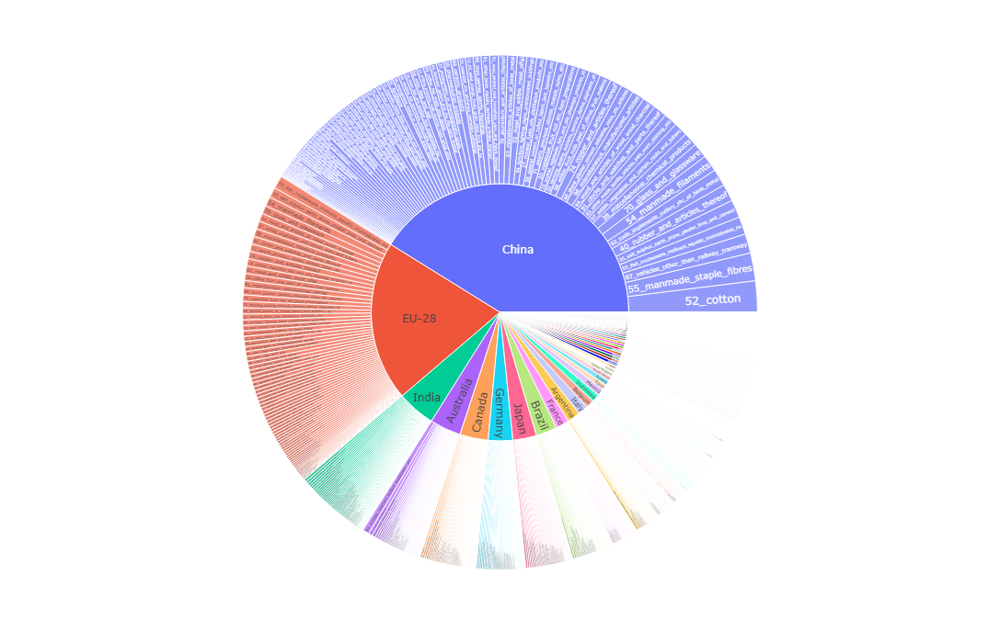

In [87]:
px.sunburst(country_export_data_merged_with_emissions[country_export_data_merged_with_emissions['year']==2008], path=['country_or_area', 'category'], values='Annual CO₂ emissions (tonnes )', height=700, width=1200)

In [88]:
grouped_sector_by_country_imports = country_import_data.groupby(['category', 'year', 'country_or_area']).agg({'comm_code':'first','commodity':'first', 'trade_usd':'sum', 'quantity':'sum'})
grouped_sector_by_country_exports = country_export_data.groupby(['category', 'year', 'country_or_area']).agg({'comm_code':'first','commodity':'first', 'trade_usd':'sum', 'quantity':'sum'})

In [89]:
category_import_list = list(grouped_sector_by_country_imports.index.get_level_values(0).unique())
year_import_list = list(grouped_sector_by_country_imports.index.get_level_values(1).unique())
category_export_list = list(grouped_sector_by_country_exports.index.get_level_values(0).unique())
year_export_list = list(grouped_sector_by_country_exports.index.get_level_values(1).unique())

In [90]:
def create_country_sector_import_pie_chart(category):
    chart1 = px.sunburst(grouped_sector_by_country_imports.loc[category].reset_index(), path=['year', 'country_or_area'], values='trade_usd', height=700, width=1200, title="Total Imports Per Year for {}".format(category))
    
    return chart1

def create_country_sector_export_pie_chart(category):
    chart2 = px.sunburst(grouped_sector_by_country_exports.loc[category].reset_index(), path=['year', 'country_or_area'], values='trade_usd', height=700, width=1200, title="Total Imports Per Year for {}".format(category))
    
    return chart2

In [91]:
interact(create_country_sector_import_pie_chart, category=category_import_list)

Column
    [0] Column
        [0] Select(name='category', options=['01_live_animals', ...], value='01_live_animals')
    [1] Row
        [0] Plotly(Figure, name='interactive76510')

In [92]:
interact(create_country_sector_export_pie_chart, category=category_export_list)

Column
    [0] Column
        [0] Select(name='category', options=['01_live_animals', ...], value='01_live_animals')
    [1] Row
        [0] Plotly(Figure, name='interactive76519')

In [93]:
country_gdp_data

,Country,Region,Population,Area (sq. mi.),Pop. Density (per sq. mi.),Coastline (coast/area ratio),Net migration,Infant mortality (per 1000 births),GDP ($ per capita),Literacy (%),Phones (per 1000),Arable (%),Crops (%),Other (%),Climate,Birthrate,Deathrate,Agriculture,Industry,Service
0,Afghanistan,ASIA (EX. NEAR EAST),31056997,647500,"48,0","0,00","23,06","163,07",700.0,"36,0","3,2","12,13","0,22","87,65",1,"46,6","20,34","0,38","0,24","0,38"
1,Albania,EASTERN EUROPE,3581655,28748,"124,6","1,26","-4,93","21,52",4500.0,"86,5","71,2","21,09","4,42","74,49",3,"15,11","5,22","0,232","0,188","0,579"
2,Algeria,NORTHERN AFRICA,32930091,2381740,"13,8","0,04","-0,39",31,6000.0,"70,0","78,1","3,22","0,25","96,53",1,"17,14","4,61","0,101","0,6","0,298"
3,American Samoa,OCEANIA,57794,199,"290,4","58,29","-20,71","9,27",8000.0,"97,0","259,5",10,15,75,2,"22,46","3,27",NaN,NaN,NaN
4,Andorra,WESTERN EUROPE,71201,468,"152,1","0,00","6,6","4,05",19000.0,"100,0","497,2","2,22",0,"97,78",3,"8,71","6,25",NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,West Bank,NEAR EAST,2460492,5860,"419,9","0,00","2,98","19,62",800.0,NaN,"145,2","16,9","18,97","64,13",3,"31,67","3,92","0,09","0,28","0,63"
223,Western Sahara,NORTHERN AFRICA,273008,266000,"1,0","0,42",NaN,NaN,NaN,NaN,NaN,"0,02",0,"99,98",1,NaN,NaN,NaN,NaN,"0,4"
224,Yemen,NEAR EAST,21456188,527970,"40,6","0,36",0,"61,5",800.0,"50,2","37,2","2,78","0,24","96,98",1,"42,89","8,3","0,135","0,472","0,393"
225,Zambia,SUB-SAHARAN AFRICA,11502010,752614,"15,3","0,00",0,"88,29",800.0,"80,6","8,2","7,08","0,03","92,9",2,41,"19,93","0,22","0,29","0,489"


In [94]:
carbon_emission_data_for_gdp_merging = carbon_emission_life_expect_data[['Country', 'CO2Emissions']]
carbon_emission_data_for_gdp_merging

,Country,CO2Emissions
0,Afghanistan,9900004
1,Albania,5208319
2,Algeria,156220560
3,Angola,30566933
4,Anguilla,30262
...,...,...
203,Vietnam,206042140
204,Western Sahara,207592
205,Yemen,25647990
206,Zambia,4230584


In [95]:
emission_gdp_merged = pd.merge(left=country_gdp_data[['Country']], right=carbon_emission_data_for_gdp_merging, on='Country', how='right')
emission_gdp_merged

,Country,CO2Emissions
0,Afghanistan,9900004
1,Albania,5208319
2,Algeria,156220560
3,Angola,30566933
4,Anguilla,30262
...,...,...
203,Vietnam,206042140
204,Western Sahara,207592
205,Yemen,25647990
206,Zambia,4230584


In [96]:
country_gdp_data.set_index('Country')[['GDP ($ per capita)']].hvplot.bar(height=700, rot=90, width=1300,title='Total Country GDP')

:Bars   [Country]   (GDP ($ per capita))

In [97]:
emission_gdp_merged.set_index('Country')[['CO2Emissions']].hvplot.bar(height=700, rot=90, width=1300)

:Bars   [Country]   (CO2Emissions)

In [98]:
ghg_by_sector_data

,Sub-sector,GlobalShare
0,Road,11.9
1,Aviation,1.9
2,Rail,0.4
3,Pipeline,0.3
4,Ship,1.7
5,Residential,10.9
6,Commercial,6.6
7,Iron & Steel,7.2
8,Non-ferous metals,0.7
9,Machinery,0.5


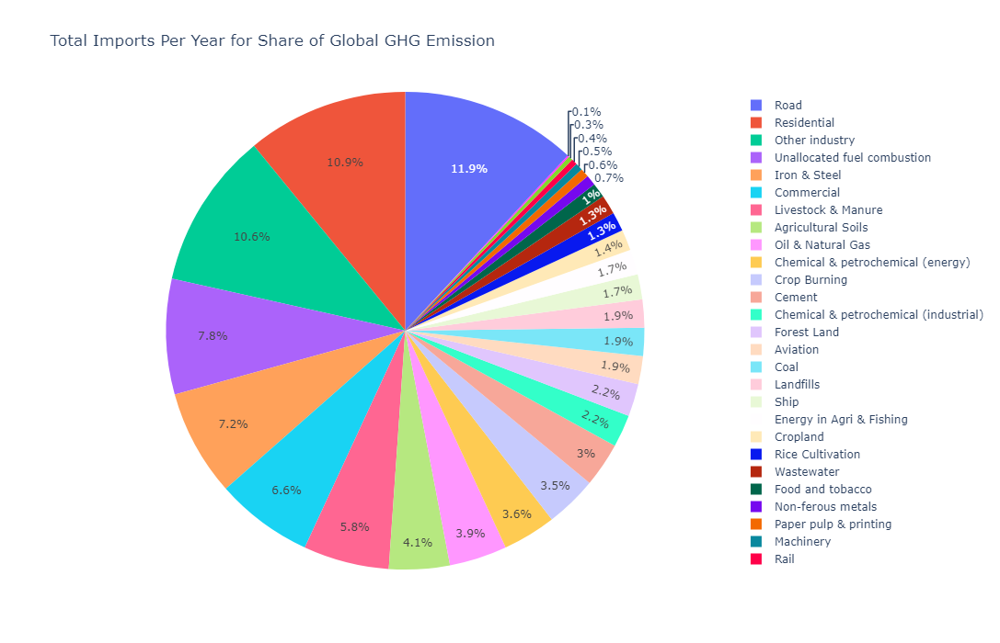

In [99]:

px.pie(ghg_by_sector_data, values='GlobalShare', names='Sub-sector',  height=700, width=1200, title="Total Imports Per Year for Share of Global GHG Emission")